In [122]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time

from sklearn.model_selection import train_test_split

import os
import random
from pathlib import Path

import cv2
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

import segmentation_models_pytorch as smp

from tqdm.auto import tqdm
import psutil

In [63]:
DATA_ROOT = Path("/Users/sanahbhimani/git/mml_dinolite_vision/March17_TrueTestTouches")

IMG_DIR = DATA_ROOT / "silicon"
MASK_DIR = DATA_ROOT / "silicon" / "masks"

DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # for trying on nersc i guess
SEED = 42

PATCH_H = 1024
PATCH_W = 2048
BATCH_SIZE = 1
NUM_EPOCHS = 5 #40
LR = 3e-4 # learning rate, was 1e-3

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

print("Device:", DEVICE)

Device: cpu


7 images found


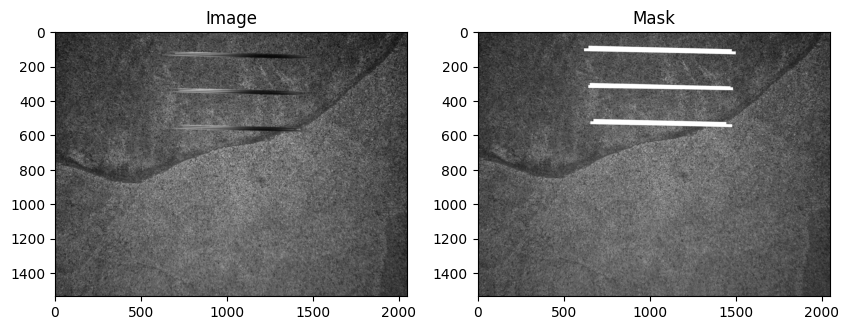

In [39]:
image_paths = sorted(list(IMG_DIR.glob("*.png")))

mask_paths = []
for img_path in image_paths:
    mask_path = MASK_DIR / img_path.name
    if not mask_path.exists():
        raise FileNotFoundError(f"Missing mask for {img_path.name}")
    mask_paths.append(mask_path)

print(f"{len(image_paths)} images found")

# visualize 1 pair
img = cv2.imread(str(image_paths[0]), 0)
mask = cv2.imread(str(mask_paths[0]), 0)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.title("Image"); plt.imshow(img, cmap='gray')
plt.subplot(1,2,2); plt.title("Mask"); plt.imshow(mask, cmap='gray')

In [60]:
# =========================
# Utility functions
# =========================
def load_grayscale(path: Path) -> np.ndarray:
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Could not read image: {path}")
    return img

def normalize_image(img: np.ndarray) -> np.ndarray:
    return img.astype(np.float32) / 255.0

def binarize_mask(mask: np.ndarray) -> np.ndarray:
    return (mask > 245).astype(np.float32)

def paired_random_crop(img: np.ndarray, mask: np.ndarray, crop_h: int, crop_w: int):
    h, w = img.shape

    if h < crop_h or w < crop_w:
        pad_h = max(0, crop_h - h)
        pad_w = max(0, crop_w - w)
        img = np.pad(img, ((0, pad_h), (0, pad_w)), mode="constant")
        mask = np.pad(mask, ((0, pad_h), (0, pad_w)), mode="constant")
        h, w = img.shape

    y = random.randint(0, h - crop_h)
    x = random.randint(0, w - crop_w)

    return img[y:y+crop_h, x:x+crop_w], mask[y:y+crop_h, x:x+crop_w]

def paired_augment(img: np.ndarray, mask: np.ndarray):
    if random.random() < 0.5:
        img = np.fliplr(img).copy()
        mask = np.fliplr(mask).copy()

    if random.random() < 0.5:
        img = np.flipud(img).copy()
        mask = np.flipud(mask).copy()

    k = random.randint(0, 3)
    if k > 0:
        img = np.rot90(img, k).copy()
        mask = np.rot90(mask, k).copy()

    if random.random() < 0.7:
        alpha = random.uniform(0.9, 1.1)
        beta = random.uniform(-0.05, 0.05)
        img = np.clip(alpha * img + beta, 0.0, 1.0)

    return img, mask

def get_ram_gb():
    process = psutil.Process(os.getpid())
    mem_bytes = process.memory_info().rss
    return mem_bytes / (1024 ** 3)

In [28]:
# =========================
# Dataset
# =========================
class TestTouchSegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths, patch_h=768, patch_w=1536, augment=False, patches_per_image=20):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.patch_h = patch_h
        self.patch_w = patch_w
        self.augment = augment
        self.patches_per_image = patches_per_image
        assert len(self.image_paths) == len(self.mask_paths)

    def __len__(self):
        return len(self.image_paths) * self.patches_per_image

    def __getitem__(self, idx):
        real_idx = idx % len(self.image_paths)

        img = load_grayscale(self.image_paths[real_idx])
        mask = load_grayscale(self.mask_paths[real_idx])

        img = normalize_image(img)
        mask = binarize_mask(mask)

        img, mask = paired_random_crop(img, mask, self.patch_h, self.patch_w)

        if self.augment:
            img, mask = paired_augment(img, mask)

        img = torch.from_numpy(img).unsqueeze(0).float()
        mask = torch.from_numpy(mask).unsqueeze(0).float()
        return img, mask

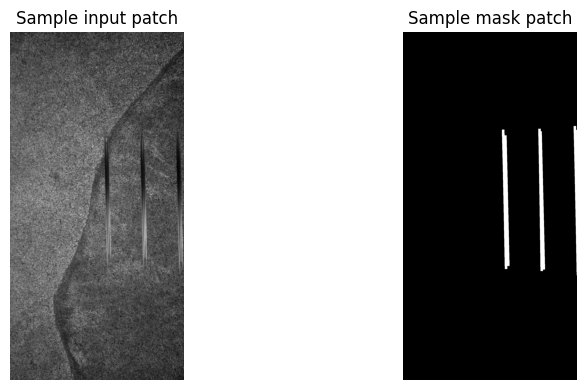

In [57]:
## cropping image

sample_ds = TestTouchSegmentationDataset(
    image_paths=image_paths,
    mask_paths=mask_paths,
    patch_h=PATCH_H,
    patch_w=PATCH_W,
    augment=True,
    patches_per_image=1
)

sample_img, sample_mask = sample_ds[0]

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.title("Sample input patch")
plt.imshow(sample_img[0], cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Sample mask patch")
plt.imshow(sample_mask[0], cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()

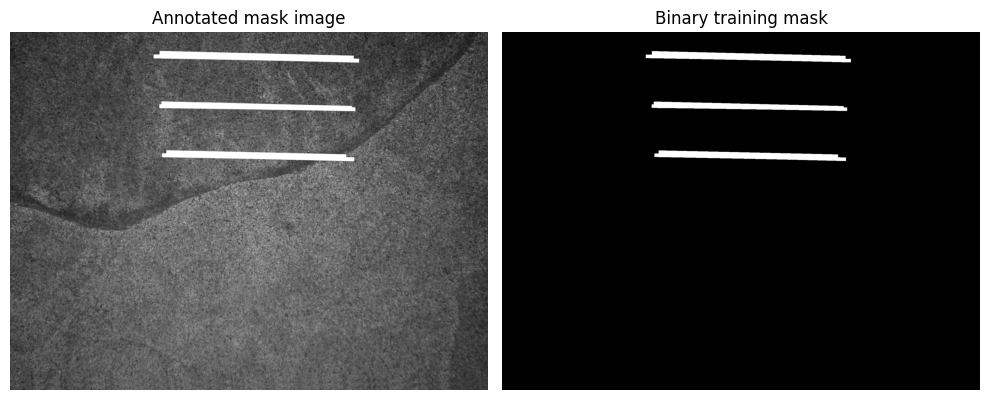

In [58]:
raw_mask = load_grayscale(mask_paths[0])
bin_mask = binarize_mask(raw_mask)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.title("Annotated mask image")
plt.imshow(raw_mask, cmap="gray")
plt.axis("off")

plt.subplot(1,2,2)
plt.title("Binary training mask")
plt.imshow(bin_mask, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()

In [59]:
## train/validation split + dataloaders

train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=SEED
)

train_ds = TestTouchSegmentationDataset(
    train_imgs, train_masks,
    patch_h=PATCH_H,
    patch_w=PATCH_W,
    augment=True,
    patches_per_image=1 # was 30 
)

val_ds = TestTouchSegmentationDataset(
    val_imgs, val_masks,
    patch_h=PATCH_H,
    patch_w=PATCH_W,
    augment=False,
    patches_per_image=1 #10
)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print("Train images:", len(train_imgs))
print("Val images:", len(val_imgs))
print("Train batches:", len(train_loader))
print("Val batches:", len(val_loader))

Train images: 5
Val images: 2
Train batches: 5
Val batches: 2


In [34]:
## model cell

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=1,
    classes=1,
).to(DEVICE)

print(model.__class__.__name__)

Unet


In [35]:
## loss /metric/ optimizer cell

bce_loss = nn.BCEWithLogitsLoss()

def dice_loss_from_logits(logits, targets, eps=1e-7):
    probs = torch.sigmoid(logits)
    num = 2 * (probs * targets).sum(dim=(2, 3))
    den = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3)) + eps
    dice = num / den
    return 1 - dice.mean()

def total_loss(logits, targets):
    return 0.5 * bce_loss(logits, targets) + 0.5 * dice_loss_from_logits(logits, targets)

def dice_score_from_logits(logits, targets, threshold=0.5, eps=1e-7):
    probs = torch.sigmoid(logits)
    preds = (probs > threshold).float()
    num = 2 * (preds * targets).sum(dim=(2, 3))
    den = preds.sum(dim=(2, 3)) + targets.sum(dim=(2, 3)) + eps
    return (num / den).mean().item()

optimizer = torch.optim.Adam(model.parameters(), lr=LR)

In [62]:
## sanity check

imgs, masks = next(iter(train_loader))
print("imgs shape:", imgs.shape)
print("masks shape:", masks.shape)

imgs shape: torch.Size([1, 1, 2048, 1024])
masks shape: torch.Size([1, 1, 2048, 1024])


## The training loop 
- saves the best model by looking for the best validation metrics (the higher val_dice is per epoch, that epoch gets saved as the best model)

In [66]:
# =========================
# Training loop with tqdm + RAM tracking since not on supercomputer
# =========================
best_val_dice = 0.0
save_path = DATA_ROOT / "best_unet_tt.pth"

train_loss_history = []
val_loss_history = []
train_dice_history = []
val_dice_history = []
ram_history = []
epoch_time_history = []

for epoch in range(NUM_EPOCHS):
    epoch_start = time.time()

    # ---- Train ----
    model.train()
    train_loss_total = 0.0
    train_dice_total = 0.0

    train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [train]", leave=False)

    for imgs, masks in train_pbar:
        imgs = imgs.to(DEVICE)
        masks = masks.to(DEVICE)

        optimizer.zero_grad()
        logits = model(imgs)
        loss = total_loss(logits, masks)
        loss.backward()
        optimizer.step()

        train_loss_total += loss.item()
        batch_dice = dice_score_from_logits(logits.detach(), masks)
        train_dice_total += batch_dice

        train_pbar.set_postfix({
            "loss": f"{loss.item():.4f}",
            "dice": f"{batch_dice:.4f}",
            "RAM_GB": f"{get_ram_gb():.2f}"
        })

    # ---- Validation ----
    model.eval()
    val_loss_total = 0.0
    val_dice_total = 0.0

    val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [val]", leave=False)

    with torch.no_grad():
        for imgs, masks in val_pbar:
            imgs = imgs.to(DEVICE)
            masks = masks.to(DEVICE)

            logits = model(imgs)
            loss = total_loss(logits, masks)

            val_loss_total += loss.item()
            batch_dice = dice_score_from_logits(logits, masks)
            val_dice_total += batch_dice

            val_pbar.set_postfix({
                "loss": f"{loss.item():.4f}",
                "dice": f"{batch_dice:.4f}",
                "RAM_GB": f"{get_ram_gb():.2f}"
            })

    # ---- Averages ----
    train_loss_avg = train_loss_total / len(train_loader)
    train_dice_avg = train_dice_total / len(train_loader)
    val_loss_avg = val_loss_total / len(val_loader)
    val_dice_avg = val_dice_total / len(val_loader)

    epoch_ram = get_ram_gb()
    epoch_time = time.time() - epoch_start

    train_loss_history.append(train_loss_avg)
    val_loss_history.append(val_loss_avg)
    train_dice_history.append(train_dice_avg)
    val_dice_history.append(val_dice_avg)
    ram_history.append(epoch_ram)
    epoch_time_history.append(epoch_time)

    print(
        f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | "
        f"train_loss={train_loss_avg:.4f} train_dice={train_dice_avg:.4f} | "
        f"val_loss={val_loss_avg:.4f} val_dice={val_dice_avg:.4f} | "
        f"RAM={epoch_ram:.2f} GB | time={epoch_time:.1f}s"
    )

    if val_dice_avg > best_val_dice:
        best_val_dice = val_dice_avg
        torch.save(model.state_dict(), save_path)
        print(f"  saved best model to {save_path}")

Epoch 01/5 | train_loss=0.2676 train_dice=0.5782 | val_loss=0.5383 val_dice=0.1372 | RAM=2.50 GB | time=33.2s
  saved best model to /Users/sanahbhimani/git/mml_dinolite_vision/March17_TrueTestTouches/best_unet_tt.pth


Epoch 02/5 | train_loss=0.2561 train_dice=0.5947 | val_loss=0.3352 val_dice=0.4108 | RAM=2.53 GB | time=31.7s
  saved best model to /Users/sanahbhimani/git/mml_dinolite_vision/March17_TrueTestTouches/best_unet_tt.pth


Epoch 03/5 | train_loss=0.2517 train_dice=0.6099 | val_loss=0.3603 val_dice=0.4275 | RAM=2.31 GB | time=32.5s
  saved best model to /Users/sanahbhimani/git/mml_dinolite_vision/March17_TrueTestTouches/best_unet_tt.pth


Epoch 04/5 | train_loss=0.2633 train_dice=0.5781 | val_loss=0.4333 val_dice=0.3258 | RAM=2.32 GB | time=32.1s


Epoch 05/5 | train_loss=0.3757 train_dice=0.3626 | val_loss=3.4531 val_dice=0.0634 | RAM=2.36 GB | time=32.1s


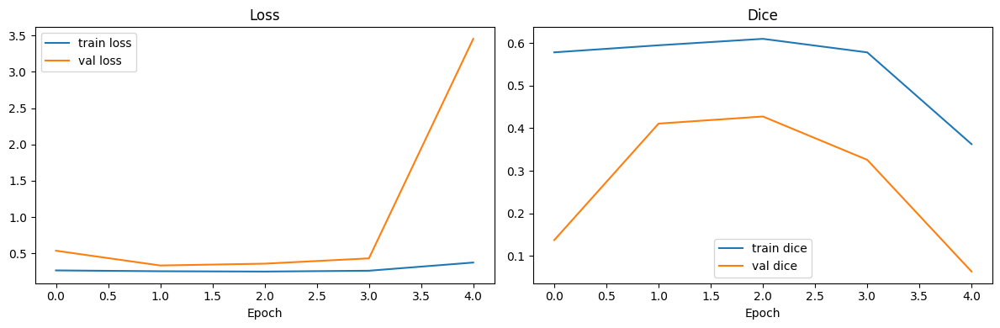

In [67]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(train_loss_history, label="train loss")
plt.plot(val_loss_history, label="val loss")
plt.title("Loss")
plt.xlabel("Epoch")
plt.legend()

plt.subplot(1,2,2)
plt.plot(train_dice_history, label="train dice")
plt.plot(val_dice_history, label="val dice")
plt.title("Dice")
plt.xlabel("Epoch")
plt.legend()

plt.tight_layout()
plt.show()

## Now load model

Conclusion: It has learned a usable segmentation of test-touch lines.

In [68]:
best_model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=1,
    classes=1,
).to(DEVICE)

best_model.load_state_dict(torch.load(save_path, map_location=DEVICE))
best_model.eval()

print("Loaded best model from:", save_path)

Loaded best model from: /Users/sanahbhimani/git/mml_dinolite_vision/March17_TrueTestTouches/best_unet_tt.pth


In [69]:
def visualize_prediction(idx, threshold=0.5):
    img = load_grayscale(image_paths[idx])
    true_mask = load_grayscale(mask_paths[idx])

    img_norm = normalize_image(img)
    x = torch.from_numpy(img_norm).unsqueeze(0).unsqueeze(0).float().to(DEVICE)

    with torch.no_grad():
        logits = best_model(x)
        prob = torch.sigmoid(logits)[0, 0].cpu().numpy()

    pred_mask = (prob > threshold).astype(np.uint8) * 255

    overlay = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    overlay[pred_mask > 0] = [255, 0, 0]

    plt.figure(figsize=(18, 4))

    plt.subplot(1, 5, 1)
    plt.title("Raw image")
    plt.imshow(img, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.title("True mask")
    plt.imshow(true_mask, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.title("Pred prob")
    plt.imshow(prob, cmap="magma")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.title(f"Pred mask > {threshold}")
    plt.imshow(pred_mask, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Image 0: silicon_za_39_X_115p3.png


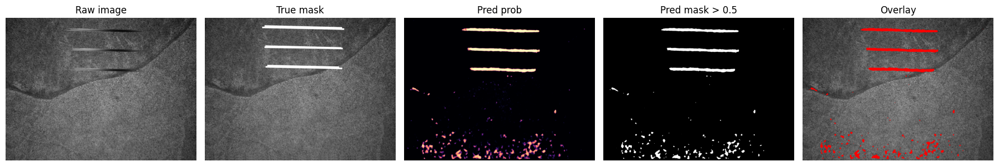


Image 1: silicon_za_39p03_ZC.png


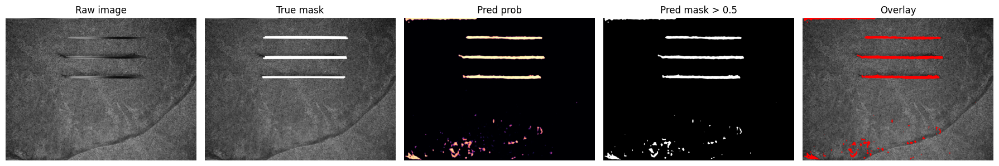


Image 2: silicon_za_39p119.png


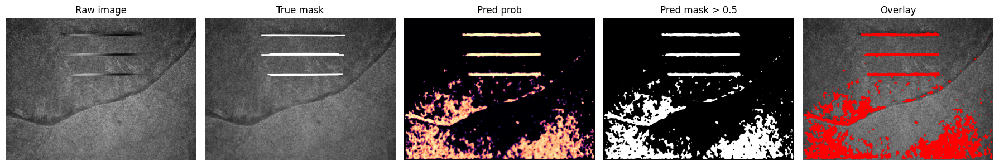


Image 3: silicon_za_39p12_X_114p3_zc_52p100.png


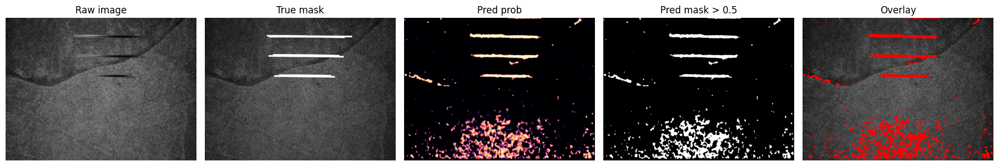


Image 4: silicon_za_39p146.png


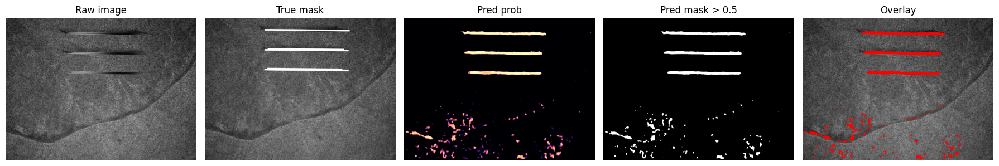


Image 5: silicon_za_39p178_4p2_4p3mm_ZC.png


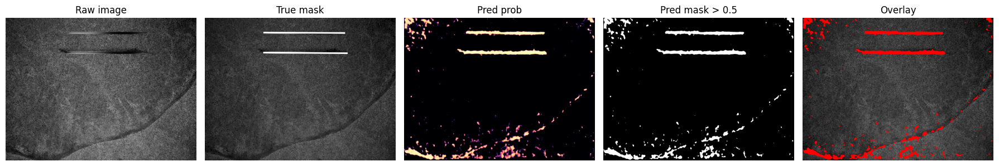


Image 6: silicon_za_39p522_3p2mm.png


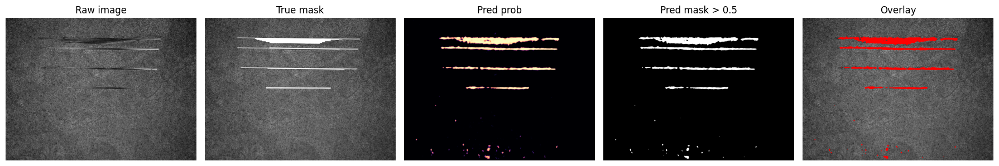

In [70]:
for i in range(len(image_paths)):
    print(f"\nImage {i}: {image_paths[i].name}")
    visualize_prediction(i, threshold=0.5)

We've now gone from raw image to predicted mask of test touch lines using Unet ML framework.

*What's next?*
- isolate each line
- find endpoints
- compute pixel length
- convert to mm using FOV

Unet is great for pixel segmentation which allowed us to go from raw image to a predicted mask of true touch lines. And so I think this means we can do classical post-processing on that predicted mask to:
- identify separate touch lines/groups in the image
- measure each test touch individually
- convert px --> mm using FOV

## Two Layer ML framework:
1. Unet: which will find the true test touch region and separate real touch from junk/background and identify the most recent touch too if we want
2. Then develop a second ML model that predicts the length or the endpoints (so a CNN/MLP/lightweight regressor)

This way the lengths of my white mask aren't taken so literally and the endpoint regression model would learn from our actual measured lengths and not from teh literal white bar extent

We can train the second ML model using the cropped touch, the FOV in mm, and the measured cut length in mm

In [104]:
def crop_latest_touch_roi(gray, latest, pad_x=80, pad_y=30):
    """
    Crop a rectangular ROI around the selected most recent touch.
    """
    H, W = gray.shape

    x1 = max(0, latest["x1"] - pad_x)
    x2 = min(W, latest["x2"] + pad_x)
    y0, y1 = latest["band"]
    y1 = min(H, y1 + pad_y)
    y0 = max(0, y0 - pad_y)

    roi = gray[y0:y1, x1:x2]

    return roi, {"x1": x1, "x2": x2, "y0": y0, "y1": y1}

def build_regression_sample(idx, measured_length_mm, fov_width_mm, threshold=0.7, min_length_px=700, max_y=1100):
    out = segment_and_measure_latest(
        idx,
        fov_width_mm=fov_width_mm,
        threshold=threshold,
        min_length_px=min_length_px,
        max_y=max_y
    )

    latest = out[0] if isinstance(out, tuple) else out["latest"]

    if latest is None:
        raise ValueError(f"No latest touch found for image index {idx}")

    gray = load_grayscale(image_paths[idx])
    roi, bounds = crop_latest_touch_roi(gray, latest)

    target_norm = measured_length_mm / fov_width_mm

    return {
        "image_name": image_paths[idx].name,
        "roi": roi,
        "fov_mm": float(fov_width_mm),
        "target_norm": float(target_norm),
        "target_mm": float(measured_length_mm),
        "bounds": bounds,
        "latest": latest
    }

Image: silicon_za_39p522_3p2mm.png


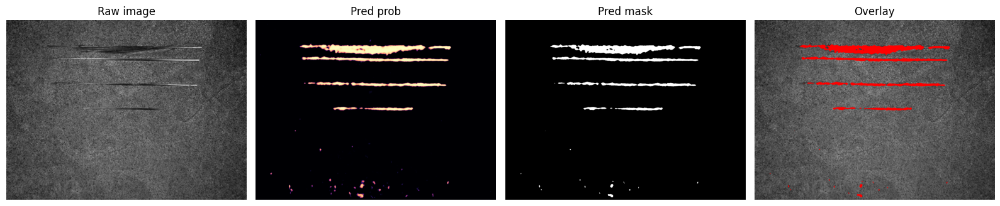

Image: silicon_za_39p522_3p2mm.png
Most recent touch: 1173 px  ->  4.928 mm (band=(533, 564), y=548)


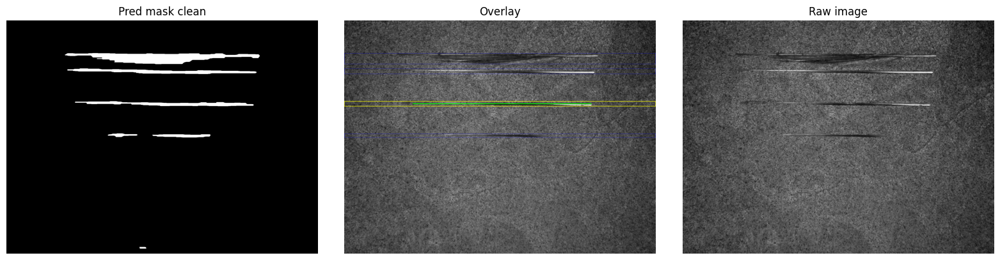

silicon_za_39p522_3p2mm.png
target mm: 4.2
target normalized: 0.48814504881450493
bounds: {'x1': 371, 'x2': 1704, 'y0': 503, 'y1': 594}


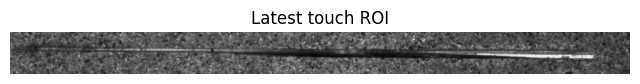

In [116]:
sample = build_regression_sample(
    idx=6,
    measured_length_mm=4.2,   
    fov_width_mm=8.604
)

print(sample["image_name"])
print("target mm:", sample["target_mm"])
print("target normalized:", sample["target_norm"])
print("bounds:", sample["bounds"])

plt.figure(figsize=(8,3))
plt.imshow(sample["roi"], cmap="gray")
plt.title("Latest touch ROI")
plt.axis("off")
plt.show()

In [117]:
regression_labels = [
    {"idx": 0, "length_mm": 3.9, "fov_mm": 8.604},
    {"idx": 1, "length_mm": 4.2, "fov_mm": 8.604},
    {"idx": 2, "length_mm": 4.0, "fov_mm": 8.649},
    {"idx": 3, "length_mm": 3.0, "fov_mm": 8.604},
    {"idx": 4, "length_mm": 4.0, "fov_mm": 8.604},
    {"idx": 5, "length_mm": 4.3, "fov_mm": 8.604},
]

Image: silicon_za_39_X_115p3.png


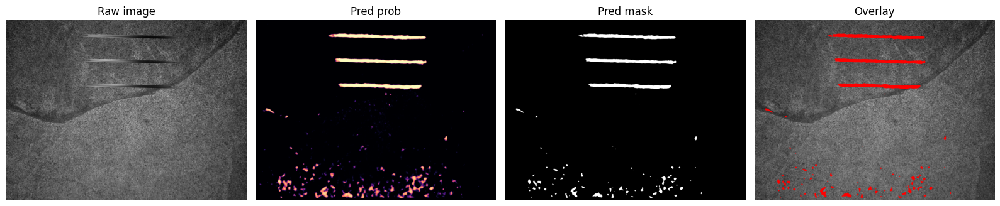

Image: silicon_za_39_X_115p3.png
Most recent touch: 701 px  ->  2.945 mm (band=(542, 584), y=563)


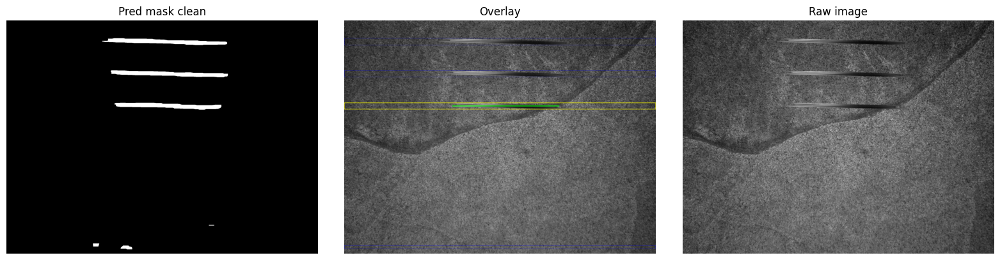

Image: silicon_za_39p03_ZC.png


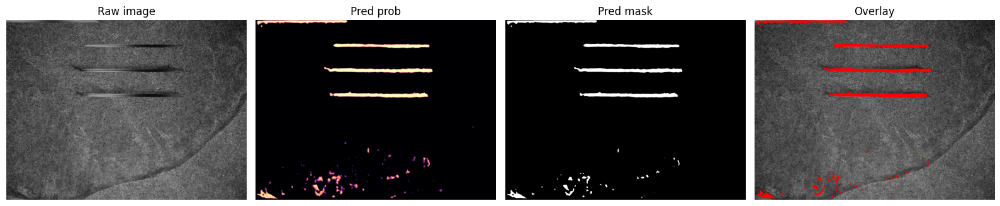

Image: silicon_za_39p03_ZC.png
Most recent touch: 810 px  ->  3.403 mm (band=(624, 660), y=642)


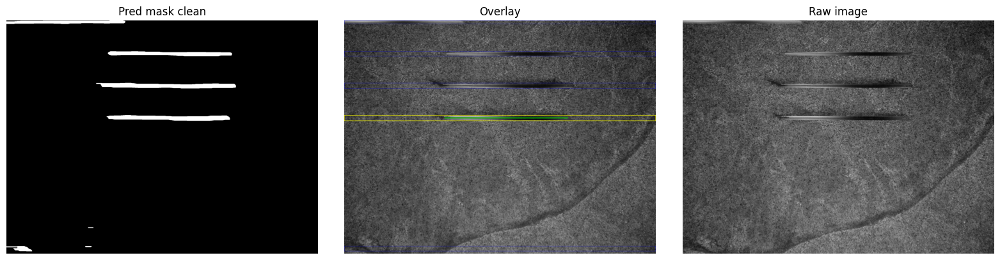

Image: silicon_za_39p119.png


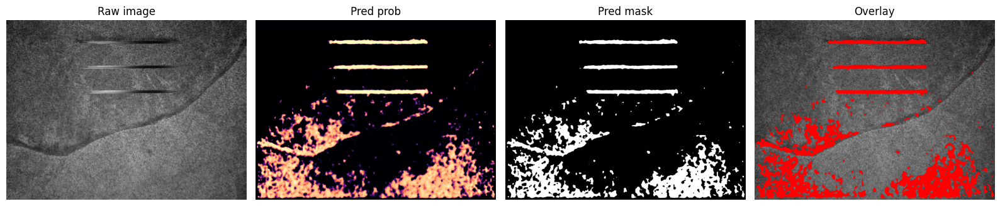

Image: silicon_za_39p119.png
Most recent touch: 780 px  ->  3.294 mm (band=(596, 629), y=612)


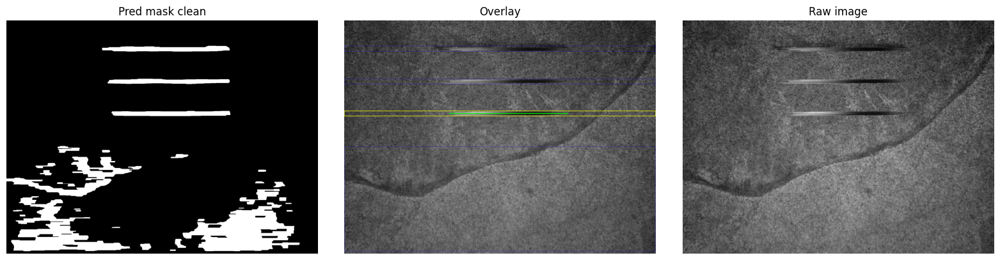

Image: silicon_za_39p12_X_114p3_zc_52p100.png


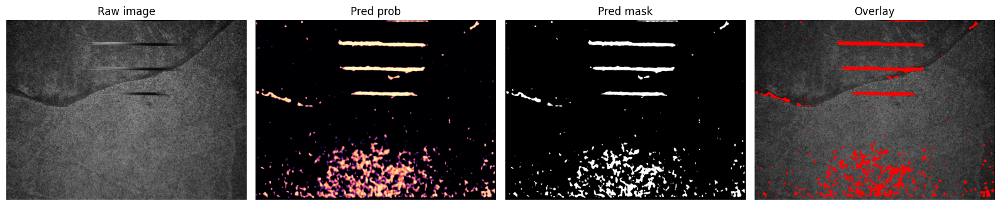

Image: silicon_za_39p12_X_114p3_zc_52p100.png
Most recent touch: 1309 px  ->  5.499 mm (band=(612, 647), y=629)


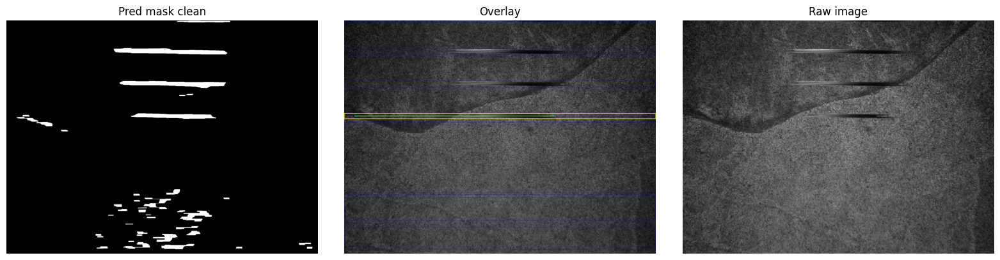

Image: silicon_za_39p146.png


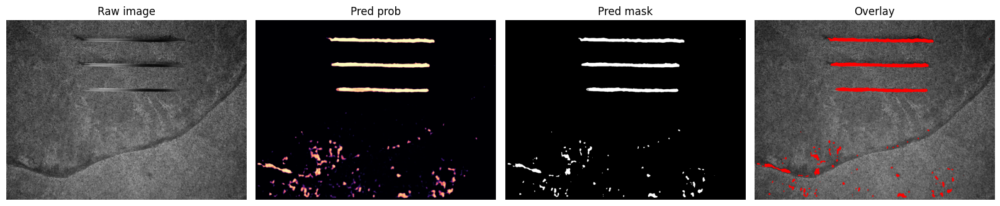

Image: silicon_za_39p146.png
Most recent touch: 780 px  ->  3.277 mm (band=(579, 615), y=597)


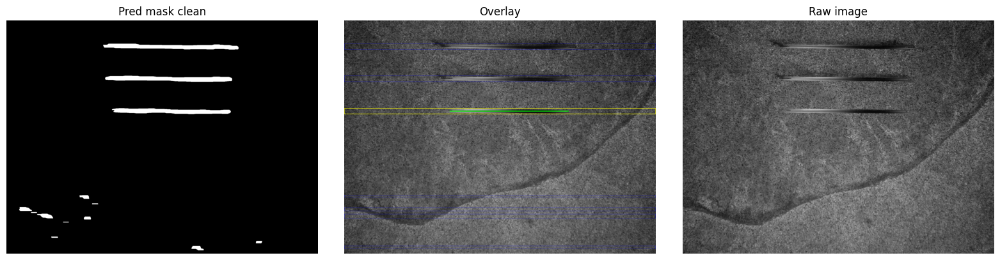

Image: silicon_za_39p178_4p2_4p3mm_ZC.png


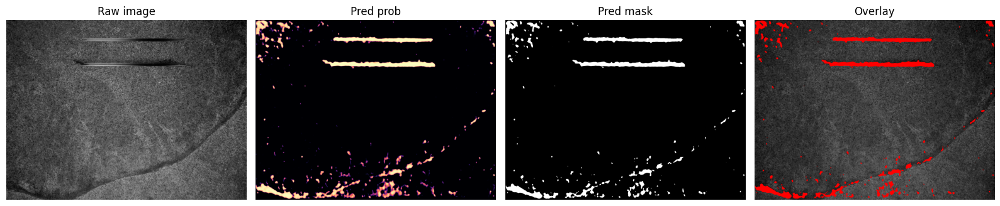

Image: silicon_za_39p178_4p2_4p3mm_ZC.png
Most recent touch: 938 px  ->  3.941 mm (band=(357, 398), y=377)


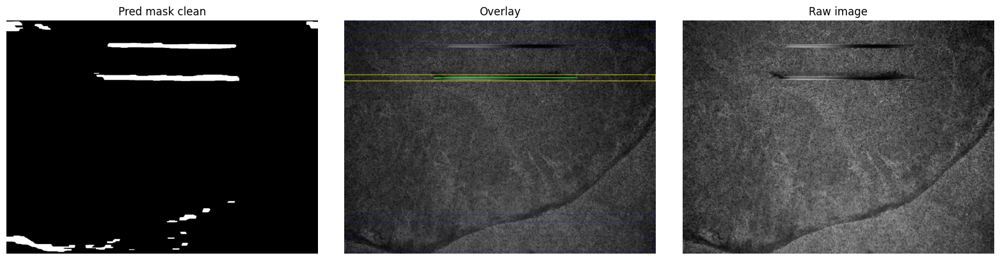

Built 6 regression samples


In [118]:
regression_samples = []

for row in regression_labels:
    try:
        sample = build_regression_sample(
            idx=row["idx"],
            measured_length_mm=row["length_mm"],
            fov_width_mm=row["fov_mm"]
        )
        regression_samples.append(sample)
    except Exception as e:
        print(f"Skipping idx={row['idx']} because: {e}")

print("Built", len(regression_samples), "regression samples")

In [119]:
for s in regression_samples:
    print(s["image_name"], "| mm:", s["target_mm"], "| norm:", round(s["target_norm"], 4))

silicon_za_39_X_115p3.png | mm: 3.9 | norm: 0.4533
silicon_za_39p03_ZC.png | mm: 4.2 | norm: 0.4881
silicon_za_39p119.png | mm: 4.0 | norm: 0.4625
silicon_za_39p12_X_114p3_zc_52p100.png | mm: 3.0 | norm: 0.3487
silicon_za_39p146.png | mm: 4.0 | norm: 0.4649
silicon_za_39p178_4p2_4p3mm_ZC.png | mm: 4.3 | norm: 0.4998


In [120]:
## dataset for the regressor
class TouchLengthDataset(Dataset):
    def __init__(self, samples, roi_h=128, roi_w=512, augment=False):
        self.samples = samples
        self.roi_h = roi_h
        self.roi_w = roi_w
        self.augment = augment

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        s = self.samples[idx]

        roi = s["roi"].astype(np.float32) / 255.0
        roi = cv2.resize(roi, (self.roi_w, self.roi_h), interpolation=cv2.INTER_AREA)

        if self.augment:
            if random.random() < 0.5:
                roi = np.fliplr(roi).copy()
            if random.random() < 0.3:
                alpha = random.uniform(0.9, 1.1)
                beta = random.uniform(-0.05, 0.05)
                roi = np.clip(alpha * roi + beta, 0.0, 1.0)

        roi = torch.from_numpy(roi).unsqueeze(0).float()
        fov = torch.tensor([s["fov_mm"]], dtype=torch.float32)
        target = torch.tensor([s["target_norm"]], dtype=torch.float32)

        return roi, fov, target

In [121]:
# small CNN regressor
class TouchLengthRegressor(nn.Module):
    def __init__(self):
        super().__init__()

        self.cnn = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.AdaptiveAvgPool2d((1, 1))
        )

        self.fc = nn.Sequential(
            nn.Linear(64 + 1, 32),   # +1 for FOV scalar
            nn.ReLU(),
            nn.Linear(32, 1)
        )

    def forward(self, roi, fov):
        x = self.cnn(roi)
        x = x.view(x.size(0), -1)
        x = torch.cat([x, fov], dim=1)
        out = self.fc(x)
        return out

In [123]:
## split regression samples and loaders

train_samples, val_samples = train_test_split(
    regression_samples,
    test_size=0.25,
    random_state=SEED
)

reg_train_ds = TouchLengthDataset(train_samples, roi_h=128, roi_w=512, augment=True)
reg_val_ds = TouchLengthDataset(val_samples, roi_h=128, roi_w=512, augment=False)

reg_train_loader = DataLoader(reg_train_ds, batch_size=2, shuffle=True)
reg_val_loader = DataLoader(reg_val_ds, batch_size=2, shuffle=False)

print("Train regression samples:", len(train_samples))
print("Val regression samples:", len(val_samples))

Train regression samples: 4
Val regression samples: 2


In [125]:
# initialize the regressor
reg_model = TouchLengthRegressor().to(DEVICE)
reg_optimizer = torch.optim.Adam(reg_model.parameters(), lr=1e-3)
reg_loss_fn = nn.MSELoss()

In [126]:
# training loop for normalized length regression
REG_EPOCHS = 10
best_val_loss = float("inf")
reg_save_path = DATA_ROOT / "best_touch_length_regressor.pth"

reg_train_loss_history = []
reg_val_loss_history = []

for epoch in range(REG_EPOCHS):
    reg_model.train()
    train_loss = 0.0

    for roi, fov, target in reg_train_loader:
        roi = roi.to(DEVICE)
        fov = fov.to(DEVICE)
        target = target.to(DEVICE)

        reg_optimizer.zero_grad()
        pred = reg_model(roi, fov)
        loss = reg_loss_fn(pred, target)
        loss.backward()
        reg_optimizer.step()

        train_loss += loss.item()

    reg_model.eval()
    val_loss = 0.0

    with torch.no_grad():
        for roi, fov, target in reg_val_loader:
            roi = roi.to(DEVICE)
            fov = fov.to(DEVICE)
            target = target.to(DEVICE)

            pred = reg_model(roi, fov)
            loss = reg_loss_fn(pred, target)
            val_loss += loss.item()

    train_loss /= len(reg_train_loader)
    val_loss /= len(reg_val_loader)

    reg_train_loss_history.append(train_loss)
    reg_val_loss_history.append(val_loss)

    print(f"Epoch {epoch+1:02d}/{REG_EPOCHS} | train_loss={train_loss:.6f} | val_loss={val_loss:.6f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(reg_model.state_dict(), reg_save_path)
        print("  saved best regressor")

Epoch 01/10 | train_loss=0.056222 | val_loss=0.032813
  saved best regressor
Epoch 02/10 | train_loss=0.023428 | val_loss=0.006765
  saved best regressor
Epoch 03/10 | train_loss=0.005772 | val_loss=0.001237
  saved best regressor
Epoch 04/10 | train_loss=0.008580 | val_loss=0.007545
Epoch 05/10 | train_loss=0.011514 | val_loss=0.005740
Epoch 06/10 | train_loss=0.010149 | val_loss=0.001649
Epoch 07/10 | train_loss=0.005393 | val_loss=0.000539
  saved best regressor
Epoch 08/10 | train_loss=0.003068 | val_loss=0.001360
Epoch 09/10 | train_loss=0.003779 | val_loss=0.002679
Epoch 10/10 | train_loss=0.004010 | val_loss=0.003295


Image: silicon_za_39_X_115p3.png
True mm: 3.9
Pred norm: 0.4718722701072693
Pred mm: 4.059989012002944


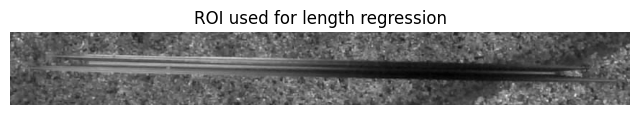

In [127]:
## inference for one sample
reg_model.load_state_dict(torch.load(reg_save_path, map_location=DEVICE))
reg_model.eval()

s = regression_samples[0]
roi = cv2.resize(s["roi"].astype(np.float32) / 255.0, (512, 128), interpolation=cv2.INTER_AREA)

roi_t = torch.from_numpy(roi).unsqueeze(0).unsqueeze(0).float().to(DEVICE)
fov_t = torch.tensor([[s["fov_mm"]]], dtype=torch.float32).to(DEVICE)

with torch.no_grad():
    pred_norm = reg_model(roi_t, fov_t).item()

pred_mm = pred_norm * s["fov_mm"]

print("Image:", s["image_name"])
print("True mm:", s["target_mm"])
print("Pred norm:", pred_norm)
print("Pred mm:", pred_mm)

plt.figure(figsize=(8,3))
plt.imshow(s["roi"], cmap="gray")
plt.title("ROI used for length regression")
plt.axis("off")
plt.show()

In [128]:
## now check inferences for all 6 samples

for s in regression_samples:
    roi = cv2.resize(s["roi"].astype(np.float32) / 255.0, (512, 128))
    roi_t = torch.from_numpy(roi).unsqueeze(0).unsqueeze(0).float().to(DEVICE)
    fov_t = torch.tensor([[s["fov_mm"]]], dtype=torch.float32).to(DEVICE)

    with torch.no_grad():
        pred_norm = reg_model(roi_t, fov_t).item()

    pred_mm = pred_norm * s["fov_mm"]

    print(s["image_name"])
    print("  true:", s["target_mm"], "| pred:", round(pred_mm, 3))

silicon_za_39_X_115p3.png
  true: 3.9 | pred: 4.059
silicon_za_39p03_ZC.png
  true: 4.2 | pred: 3.964
silicon_za_39p119.png
  true: 4.0 | pred: 4.041
silicon_za_39p12_X_114p3_zc_52p100.png
  true: 3.0 | pred: 3.869
silicon_za_39p146.png
  true: 4.0 | pred: 4.004
silicon_za_39p178_4p2_4p3mm_ZC.png
  true: 4.3 | pred: 3.79


In [131]:
## to visualize the roi (region of interest) with touch overlay

def visualize_regression_input(sample):
    roi = sample["roi"]
    bounds = sample["bounds"]
    latest = sample["latest"]

    print("Image:", sample["image_name"])
    print("Target mm:", sample["target_mm"])
    print("FOV mm:", sample["fov_mm"])
    print("Bounds:", bounds)

    # latest touch coordinates in full image
    x1_full = latest["x1"]
    x2_full = latest["x2"]
    y_full = latest["y"]

    # convert to ROI-local coordinates
    x1_roi = x1_full - bounds["x1"]
    x2_roi = x2_full - bounds["x1"]
    y_roi = y_full - bounds["y0"]

    overlay = cv2.cvtColor(roi, cv2.COLOR_GRAY2RGB)
    cv2.line(overlay, (x1_roi, y_roi), (x2_roi, y_roi), (255, 0, 0), 2)

    plt.figure(figsize=(12, 3))
    plt.subplot(1, 2, 1)
    plt.title("ROI")
    plt.imshow(roi, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("ROI + coarse latest-touch line")
    plt.imshow(overlay)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

## to visualize regressor saliency

def visualize_regressor_saliency(reg_model, sample, device):
    reg_model.eval()

    roi = cv2.resize(sample["roi"].astype(np.float32) / 255.0, (512, 128), interpolation=cv2.INTER_AREA)
    roi_t = torch.from_numpy(roi).unsqueeze(0).unsqueeze(0).float().to(device)
    roi_t.requires_grad_(True)

    fov_t = torch.tensor([[sample["fov_mm"]]], dtype=torch.float32).to(device)

    pred = reg_model(roi_t, fov_t)
    pred.backward()

    saliency = roi_t.grad.abs()[0, 0].cpu().numpy()
    saliency = saliency / (saliency.max() + 1e-8)

    plt.figure(figsize=(15, 4))

    plt.subplot(1, 3, 1)
    plt.title("ROI")
    plt.imshow(roi, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Saliency")
    plt.imshow(saliency, cmap="hot")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("ROI + saliency")
    plt.imshow(roi, cmap="gray")
    plt.imshow(saliency, cmap="hot", alpha=0.5)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    print("Image:", sample["image_name"])
    print("True mm:", sample["target_mm"])

Image: silicon_za_39_X_115p3.png
Target mm: 3.9
FOV mm: 8.604
Bounds: {'x1': 631, 'x2': 1492, 'y0': 512, 'y1': 614}


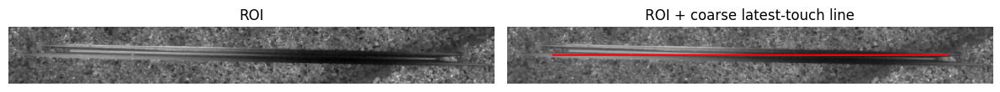

In [130]:
visualize_regression_input(regression_samples[0])

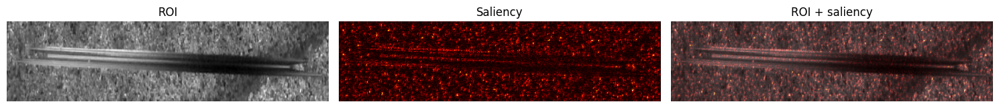

Image: silicon_za_39_X_115p3.png
True mm: 3.9


In [132]:
visualize_regressor_saliency(reg_model, regression_samples[0], DEVICE)

### should we add a third ML framework for learning if the image is angled?

## Maybe we use the Unet ML mask only to say where to look, then let a classical edge/gradient method using vertical gradient work to determine the actual endpoints from the raw image

In [101]:
def vertical_dog_groove_response(gray, sigma=2.0, delta=10):
    """
    Vertical DoG-style response for horizontal grooves.
    Enhances horizontal dark/light line structure while suppressing broad texture.
    """
    gray = gray.astype(np.float32)

    half = int(max(3, np.ceil(3 * sigma + delta)))
    y = np.arange(-half, half + 1, dtype=np.float32)

    def G(mu):
        return np.exp(-0.5 * ((y - mu) / sigma) ** 2)

    ky = G(0.0) - 0.5 * G(+delta) - 0.5 * G(-delta)
    ky -= ky.mean()
    ky /= (np.sum(np.abs(ky)) + 1e-8)

    resp = cv2.sepFilter2D(
        gray,
        ddepth=-1,
        kernelX=np.array([1], dtype=np.float32),
        kernelY=ky.astype(np.float32)
    )

    # mild horizontal smoothing
    resp = cv2.GaussianBlur(resp, (31, 1), 0)

    # absolute response strength
    resp = np.abs(resp)

    # normalize to 8-bit for easy thresholding / viz
    resp_u8 = cv2.normalize(resp, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return resp_u8


def predict_unet_mask(best_model, image_path, device, threshold=0.7):
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Could not read image: {image_path}")

    img_norm = img.astype(np.float32) / 255.0
    x = torch.from_numpy(img_norm).unsqueeze(0).unsqueeze(0).float().to(device)

    with torch.no_grad():
        logits = best_model(x)
        prob = torch.sigmoid(logits)[0, 0].cpu().numpy()

    pred_mask = (prob > threshold).astype(np.uint8) * 255
    return img, prob, pred_mask

def clean_pred_mask(pred_mask, open_len=35, close_len=60):
    bw = (pred_mask > 0).astype(np.uint8) * 255

    open_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (open_len, 5))
    bw_open = cv2.morphologyEx(bw, cv2.MORPH_OPEN, open_kernel)

    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (close_len, 3))
    bw_clean = cv2.morphologyEx(bw_open, cv2.MORPH_CLOSE, close_kernel)

    return bw_clean

def find_touch_bands_from_mask(mask, min_run=8, min_gap=20, min_row_sum=50):
    row_sum = (mask > 0).sum(axis=1)

    bands = []
    in_band = False
    start = 0

    for y, s in enumerate(row_sum):
        if (s >= min_row_sum) and (not in_band):
            in_band = True
            start = y
        elif (s < min_row_sum) and in_band:
            end = y - 1
            if (end - start + 1) >= min_run:
                bands.append([start, end])
            in_band = False

    if in_band:
        end = len(row_sum) - 1
        if (end - start + 1) >= min_run:
            bands.append([start, end])

    merged = []
    for b in bands:
        if not merged:
            merged.append(b)
        else:
            if b[0] - merged[-1][1] <= min_gap:
                merged[-1][1] = b[1]
            else:
                merged.append(b)

    return [(b[0], b[1]) for b in merged]


def measure_touches_from_bands(mask, bands, fov_width_mm, image_width_px, pad_y=5, min_width_px=50):
    mm_per_px = fov_width_mm / image_width_px
    H, W = mask.shape
    results = []

    for i, (y0, y1) in enumerate(bands):
        ya = max(0, y0 - pad_y)
        yb = min(H, y1 + pad_y)

        roi = (mask[ya:yb, :] > 0).astype(np.uint8)
        ys, xs = np.where(roi > 0)
        if len(xs) == 0:
            continue

        x1 = int(xs.min())
        x2 = int(xs.max())
        length_px = x2 - x1

        if length_px < min_width_px:
            continue

        y_mid = int((y0 + y1) / 2)

        results.append({
            "touch_id": i,
            "band": (y0, y1),
            "x1": x1,
            "x2": x2,
            "y": y_mid,
            "length_px": length_px,
            "length_mm": length_px * mm_per_px
        })

    return results

def select_most_recent_touch(results, min_length_px=700, max_y=None):
    valid = [r for r in results if r["length_px"] >= min_length_px]

    if max_y is not None:
        valid = [r for r in valid if r["y"] <= max_y]

    if len(valid) == 0:
        return None

    return max(valid, key=lambda r: r["y"])


def refine_touch_with_vertical_gradient(
    gray,
    coarse_touch,
    sigma=2.0,
    delta=10,
    pad_y=12,
    tau_frac=0.35,
    min_run_px=30,
    fov_width_mm=None
):
    """
    Use vertical-gradient response inside the coarse U-Net-selected band
    to refine x1/x2 endpoints.
    """
    H, W = gray.shape
    y0, y1 = coarse_touch["band"]

    ya = max(0, y0 - pad_y)
    yb = min(H, y1 + pad_y)

    roi_gray = gray[ya:yb, :]

    # CLAHE inside ROI
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    roi_enh = clahe.apply(roi_gray)

    # vertical-gradient response
    resp = vertical_dog_groove_response(roi_enh, sigma=sigma, delta=delta)

    # collapse along y to get x-profile
    prof = resp.max(axis=0).astype(np.float32)

    peak = prof.max()
    if peak <= 0:
        return None

    support = (prof >= tau_frac * peak).astype(np.uint8)

    # remove tiny islands in x
    if min_run_px and min_run_px > 1:
        k = cv2.getStructuringElement(cv2.MORPH_RECT, (min_run_px, 1))
        support = cv2.morphologyEx(support.reshape(1, -1), cv2.MORPH_OPEN, k).ravel()

    xs = np.where(support > 0)[0]
    if xs.size == 0:
        return None

    # longest contiguous run only
    breaks = np.where(np.diff(xs) > 1)[0]
    runs = np.split(xs, breaks + 1)
    run = max(runs, key=len)

    x1 = int(run.min())
    x2 = int(run.max())
    length_px = x2 - x1

    result = {
        "band": coarse_touch["band"],
        "x1": x1,
        "x2": x2,
        "y": coarse_touch["y"],
        "length_px": length_px,
        "resp_roi": resp,
        "support": support,
        "roi_bounds": (ya, yb)
    }

    if fov_width_mm is not None:
        mm_per_px = fov_width_mm / W
        result["length_mm"] = length_px * mm_per_px

    return result

In [102]:
## U net first then vertical gradient for using the full hybrid pipeline

def segment_and_refine_latest_touch(
    idx,
    best_model,
    image_paths,
    device,
    fov_width_mm,
    threshold=0.7,
    min_length_px=700,
    max_y=1100,
    sigma=2.0,
    delta=10,
    tau_frac=0.35
):
    image_path = image_paths[idx]
    img_name = image_path.name

    # Stage 1: U-Net segmentation
    gray, prob, pred_mask = predict_unet_mask(best_model, image_path, device, threshold=threshold)
    mask_clean = clean_pred_mask(pred_mask)

    # Stage 2: coarse band finding from U-Net mask
    bands = find_touch_bands_from_mask(mask_clean)
    results = measure_touches_from_bands(
        mask_clean,
        bands,
        fov_width_mm=fov_width_mm,
        image_width_px=gray.shape[1]
    )

    latest = select_most_recent_touch(results, min_length_px=min_length_px, max_y=max_y)

    refined = None
    if latest is not None:
        refined = refine_touch_with_vertical_gradient(
            gray,
            latest,
            sigma=sigma,
            delta=delta,
            tau_frac=tau_frac,
            fov_width_mm=fov_width_mm
        )

    # overlays
    overlay = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

    for r in results:
        y0, y1 = r["band"]
        cv2.rectangle(overlay, (0, y0), (gray.shape[1]-1, y1), (0, 0, 255), 1)

    if latest is not None:
        y0, y1 = latest["band"]
        cv2.rectangle(overlay, (0, y0), (gray.shape[1]-1, y1), (255, 255, 0), 2)
        cv2.line(overlay, (latest["x1"], latest["y"]), (latest["x2"], latest["y"]), (0, 255, 255), 2)

    if refined is not None:
        cv2.line(overlay, (refined["x1"], refined["y"]), (refined["x2"], refined["y"]), (0, 255, 0), 3)

    print("Image:", img_name)
    if latest is not None:
        print(f"Coarse latest touch: {latest['length_px']} px -> {latest['length_mm']:.3f} mm")
    else:
        print("No coarse latest touch found.")

    if refined is not None:
        print(f"Refined latest touch: {refined['length_px']} px -> {refined['length_mm']:.3f} mm")
    else:
        print("No refined touch found.")

    plt.figure(figsize=(18, 8))
    plt.subplot(2, 3, 1); plt.imshow(gray, cmap="gray"); plt.title("Raw image"); plt.axis("off")
    plt.subplot(2, 3, 2); plt.imshow(prob, cmap="magma"); plt.title("U-Net probability"); plt.axis("off")
    plt.subplot(2, 3, 3); plt.imshow(mask_clean, cmap="gray"); plt.title("Clean U-Net mask"); plt.axis("off")
    plt.subplot(2, 3, 4); plt.imshow(overlay); plt.title("Overlay"); plt.axis("off")

    if refined is not None:
        plt.subplot(2, 3, 5); plt.imshow(refined["resp_roi"], cmap="inferno"); plt.title("Vertical-gradient ROI"); plt.axis("off")
        plt.subplot(2, 3, 6); plt.plot(refined["support"]); plt.title("Refined x-support"); plt.ylim(-0.1, 1.1)

    plt.tight_layout()
    plt.show()

    return {
        "gray": gray,
        "prob": prob,
        "pred_mask": pred_mask,
        "mask_clean": mask_clean,
        "bands": bands,
        "all_results": results,
        "latest": latest,
        "refined": refined,
        "overlay": overlay,
    }

Image: silicon_za_39p03_ZC.png
Coarse latest touch: 810 px -> 3.403 mm
Refined latest touch: 469 px -> 1.970 mm


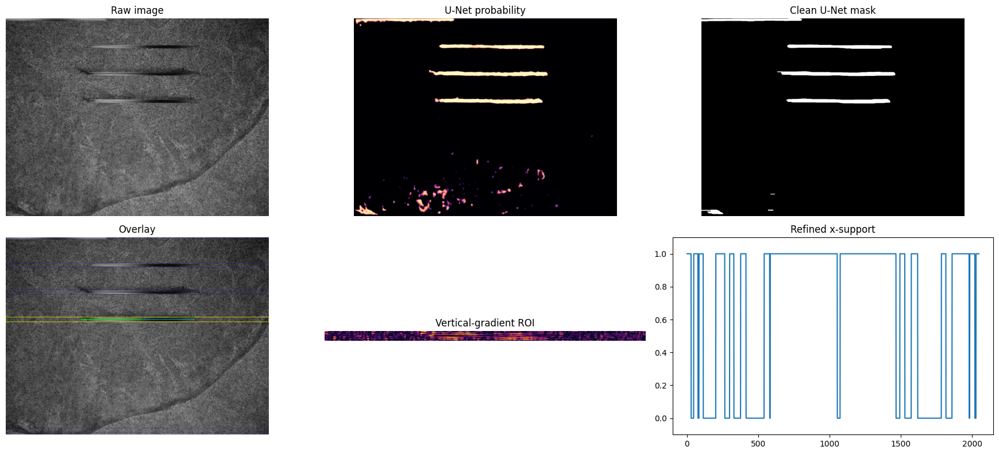

In [103]:
out = segment_and_refine_latest_touch(
    idx=1,
    best_model=best_model,
    image_paths=image_paths,
    device=DEVICE,
    fov_width_mm=8.604,
    threshold=0.7,
    min_length_px=700,
    max_y=1100,
    sigma=2.0,
    delta=10,
    tau_frac=0.35
)

## Measurement of Lines based on Model

- Note that our segmentation might be slightly thick due to the way I masked the raw images
- and endpoints tend to be a bit fuzzy
- so our length will be slightly over/under estimated

We could refine this with:
- skeletonization (1-pixel wide lines)
- better endpoint detection in the ML model I think 

In [94]:
def inspect_prediction(idx, threshold=0.5):
    img_name = image_paths[idx].name
    img = load_grayscale(image_paths[idx])

    img_norm = normalize_image(img)
    x = torch.from_numpy(img_norm).unsqueeze(0).unsqueeze(0).float().to(DEVICE)

    with torch.no_grad():
        logits = best_model(x)
        prob = torch.sigmoid(logits)[0, 0].cpu().numpy()

    pred_mask = (prob > threshold).astype(np.uint8) * 255

    overlay = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    overlay[pred_mask > 0] = [255, 0, 0]

    print("Image:", img_name)

    plt.figure(figsize=(16,4))
    plt.subplot(1,4,1); plt.title("Raw image"); plt.imshow(img, cmap="gray"); plt.axis("off")
    plt.subplot(1,4,2); plt.title("Pred prob"); plt.imshow(prob, cmap="magma"); plt.axis("off")
    plt.subplot(1,4,3); plt.title("Pred mask"); plt.imshow(pred_mask, cmap="gray"); plt.axis("off")
    plt.subplot(1,4,4); plt.title("Overlay"); plt.imshow(overlay); plt.axis("off")
    plt.tight_layout()
    plt.show()

    return img, prob, pred_mask

def clean_pred_mask(pred_mask, open_len=35, close_len=60):
    bw = (pred_mask > 0).astype(np.uint8) * 255

    open_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (open_len, 5))
    bw_open = cv2.morphologyEx(bw, cv2.MORPH_OPEN, open_kernel)

    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (close_len, 3))
    bw_clean = cv2.morphologyEx(bw_open, cv2.MORPH_CLOSE, close_kernel)

    return bw_clean


def find_touch_bands_from_mask(mask, min_run=8, min_gap=20, min_row_sum=50):
    row_sum = (mask > 0).sum(axis=1)

    bands = []
    in_band = False
    start = 0

    for y, s in enumerate(row_sum):
        if (s >= min_row_sum) and (not in_band):
            in_band = True
            start = y
        elif (s < min_row_sum) and in_band:
            end = y - 1
            if (end - start + 1) >= min_run:
                bands.append([start, end])
            in_band = False

    if in_band:
        end = len(row_sum) - 1
        if (end - start + 1) >= min_run:
            bands.append([start, end])

    merged = []
    for b in bands:
        if not merged:
            merged.append(b)
        else:
            if b[0] - merged[-1][1] <= min_gap:
                merged[-1][1] = b[1]
            else:
                merged.append(b)

    return [(b[0], b[1]) for b in merged]

def measure_touches_from_bands(mask, bands, fov_width_mm, image_width_px, pad_y=5, min_width_px=50):
    mm_per_px = fov_width_mm / image_width_px
    H, W = mask.shape
    results = []

    for i, (y0, y1) in enumerate(bands):
        ya = max(0, y0 - pad_y)
        yb = min(H, y1 + pad_y)

        roi = (mask[ya:yb, :] > 0).astype(np.uint8)

        num_labels, labels = cv2.connectedComponents(roi)
        print(f"Band {(y0, y1)} has {num_labels - 1} connected components")

        ys, xs = np.where(roi > 0)
        if len(xs) == 0:
            continue

        x1 = int(xs.min())
        x2 = int(xs.max())
        length_px = x2 - x1

        if length_px < min_width_px:
            continue

        y_mid = int((y0 + y1) / 2)

        results.append({
            "touch_id": i,
            "band": (y0, y1),
            "x1": x1,
            "x2": x2,
            "y": y_mid,
            "length_px": length_px,
            "length_mm": length_px * mm_per_px
        })

    return results

def select_most_recent_touch(results, min_length_px=700, max_y=None):
    """
    Pick the bottom-most valid touch.
    Optionally reject anything below max_y if you want to exclude bottom junk region.
    """
    valid = [r for r in results if r["length_px"] >= min_length_px]

    if max_y is not None:
        valid = [r for r in valid if r["y"] <= max_y]

    if len(valid) == 0:
        return None

    # bottom-most = largest y
    return max(valid, key=lambda r: r["y"])



def segment_and_measure_latest(idx, fov_width_mm, threshold=0.5, min_length_px=700, max_y=None):
    img_name = image_paths[idx].name
    img, prob, pred_mask = inspect_prediction(idx, threshold=threshold)

    mask_clean = clean_pred_mask(pred_mask)
    bands = find_touch_bands_from_mask(mask_clean)
    results = measure_touches_from_bands(
        mask_clean, bands,
        fov_width_mm=fov_width_mm,
        image_width_px=img.shape[1]
    )

    latest = select_most_recent_touch(results, min_length_px=min_length_px, max_y=max_y)

    overlay = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    # draw all candidate bands lightly
    for r in results:
        y0, y1 = r["band"]
        cv2.rectangle(overlay, (0, y0), (img.shape[1]-1, y1), (0, 0, 255), 1)

    # highlight selected "most recent" touch
    if latest is not None:
        y0, y1 = latest["band"]
        cv2.rectangle(overlay, (0, y0), (img.shape[1]-1, y1), (255, 255, 0), 2)
        cv2.line(overlay, (latest["x1"], latest["y"]), (latest["x2"], latest["y"]), (0, 255, 0), 3)

    print("Image:", img_name)
    if latest is None:
        print("No valid most-recent touch found.")
    else:
        print(
            f"Most recent touch: {latest['length_px']} px  ->  {latest['length_mm']:.3f} mm "
            f"(band={latest['band']}, y={latest['y']})"
        )

    plt.figure(figsize=(16,4))
    plt.subplot(1,3,1); plt.title("Pred mask clean"); plt.imshow(mask_clean, cmap="gray"); plt.axis("off")
    plt.subplot(1,3,2); plt.title("Overlay"); plt.imshow(overlay); plt.axis("off")
    plt.subplot(1,3,3); plt.title("Raw image"); plt.imshow(img, cmap="gray"); plt.axis("off")
    plt.tight_layout()
    plt.show()

    return latest, results, mask_clean, overlay

Image: silicon_za_39p03_ZC.png


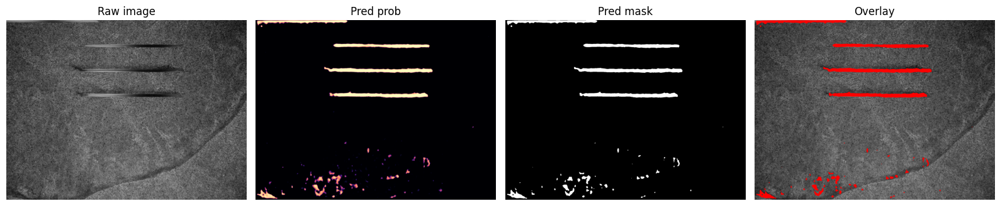

Band (0, 26) has 1 connected components
Band (203, 236) has 1 connected components
Band (410, 447) has 1 connected components
Band (624, 661) has 1 connected components
Band (1339, 1370) has 3 connected components
Band (1472, 1522) has 3 connected components
Image: silicon_za_39p03_ZC.png
Most recent touch: 836 px  ->  3.512 mm (band=(624, 661), y=642)


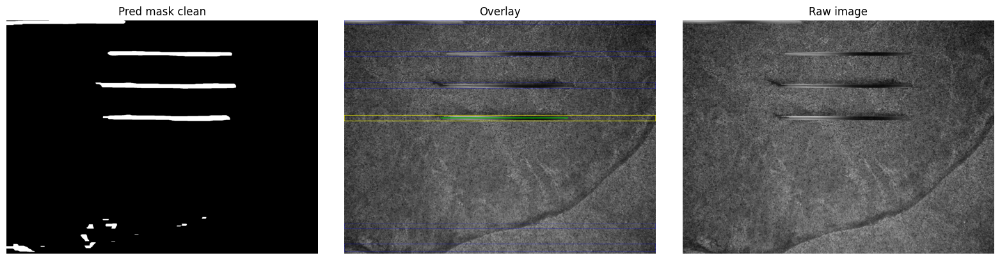

In [90]:
latest, results, mask_clean, overlay = segment_and_measure_latest(
    1,
    fov_width_mm=8.604,
    threshold=0.5,
    min_length_px=700,
    max_y=1100   # optional: helps exclude junk near bottom
)

Image: silicon_za_39p119.png


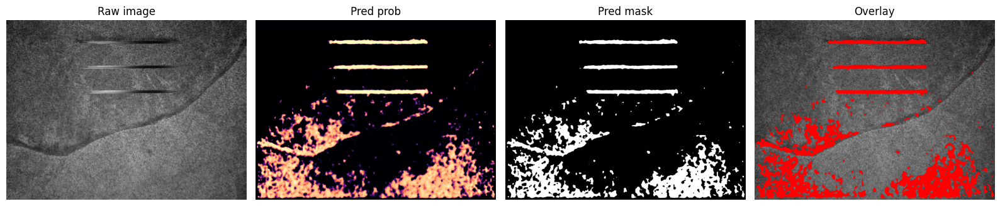

Band (167, 204) has 1 connected components
Band (384, 417) has 1 connected components
Band (596, 629) has 1 connected components
Band (830, 1519) has 26 connected components
Image: silicon_za_39p119.png
Most recent touch: 780 px  ->  3.294 mm (band=(596, 629), y=612)


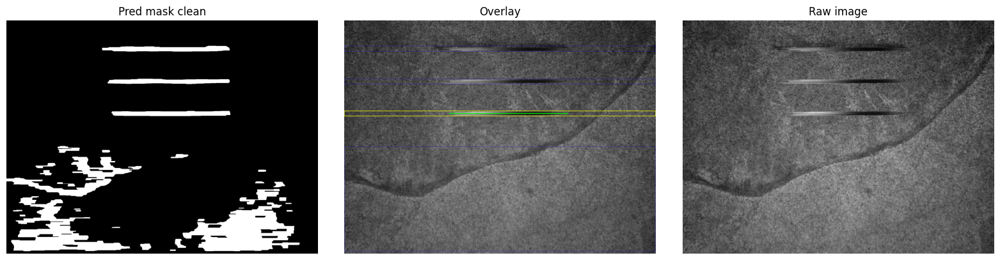

In [95]:
latest, results, mask_clean, overlay = segment_and_measure_latest(
    2,
    fov_width_mm=8.649,
    threshold=0.7,
    min_length_px=700,
    max_y=1100   # optional: helps exclude junk near bottom
)

Image: silicon_za_39p12_X_114p3_zc_52p100.png


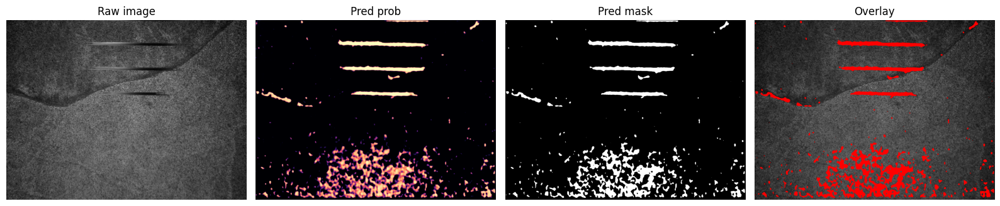

Band (2, 13) has 1 connected components
Band (182, 225) has 1 connected components
Band (399, 443) has 1 connected components
Band (485, 495) has 1 connected components
Band (611, 692) has 2 connected components
Band (1108, 1515) has 27 connected components
Image: silicon_za_39p12_X_114p3_zc_52p100.png
Most recent touch: 1321 px  ->  5.550 mm (band=(611, 692), y=651)


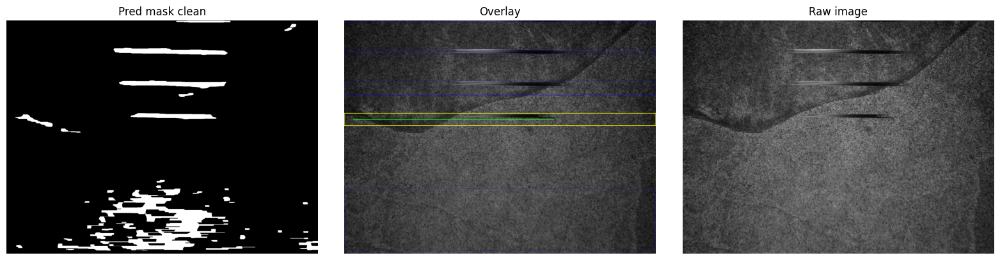

In [92]:
latest, results, mask_clean, overlay = segment_and_measure_latest(
    3,
    fov_width_mm=8.604,
    threshold=0.5,
    min_length_px=700,
    max_y=1100   # optional: helps exclude junk near bottom
)

Image: silicon_za_39p178_4p2_4p3mm_ZC.png


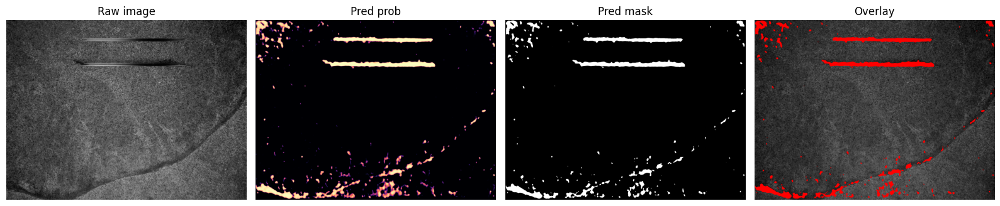

Band (6, 70) has 3 connected components
Band (147, 186) has 1 connected components
Band (357, 398) has 1 connected components
Band (1279, 1328) has 2 connected components
Band (1421, 1520) has 7 connected components
Image: silicon_za_39p178_4p2_4p3mm_ZC.png
Most recent touch: 938 px  ->  3.941 mm (band=(357, 398), y=377)


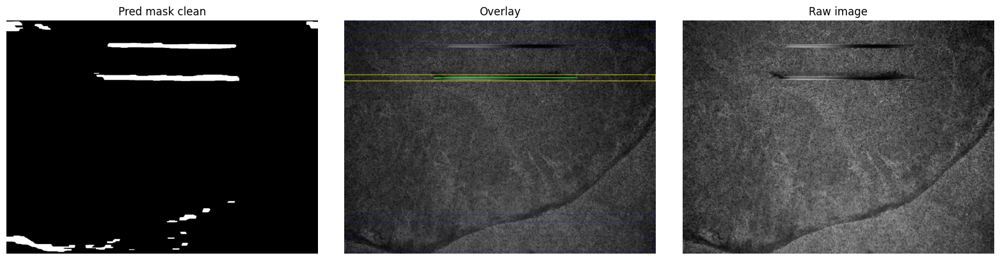

In [98]:
latest, results, mask_clean, overlay = segment_and_measure_latest(
    5,
    fov_width_mm=8.604,
    threshold=0.7,
    min_length_px=700,
    max_y=1100   # optional: helps exclude junk near bottom
)

# Miscellaneous